<h1 id="heading"  align="center"> Feature Engineering Project - 1 </h1>
<h2 align="center"> Applied Data Science with Python</h2>
<h3 align="center"> Surya Lamichhane</h3>

In [1]:
#conda install -c conda-forge jupyterlab-spellchecker


<h1 align="left"> Project statement</h1>
There are many factors (few examples are total leaving area,  neighborhood, school zone, crime index and lotsize) that buyers consider while searching for the an ideal house. The factors which most of the buyers prefer to have in their potential house infulence the price of the house. Hence, it is important to find the relevant features that can explain the price of the house in the housing market. Not all of those features can obtain directly from the housing market but also one may require a doimain knowledge and some transformations skills of the existing features. The process of finding the key features to make the analysis more robust is called the feature engineering.  

The main aim of this project is to use Python programming to
- understand the housing market data
- get familiar with data preprocessing techniques and exploratory data analysis (EDA)
- use of descreptive statistics and inferential statistics in finding the key features that influences the price
- learn data visualization techniques 
- understand common outlier detection methods

In [2]:
import numpy as np
import pandas as pd

# Dataset

**Load the data**

In [5]:
# the data is about the residential homes in Ames, Iowa
Housing_Ames = pd.read_csv(r".\Project1_Dataset_Feature_Engineering\PEP1.csv")


## Understand the dataset

The dataset is from the housing data that correspondes to the city Ames of Ioa, and those house were sold in the city between 2006 to 2010. This dataset contains 81 variables corresponds to 1460 sold houses. There are mainly three types of variables which are numerical, ordinal and categorical. 

   **Data preview**

In [6]:
#Housing_Ames.dtypes
#print(Housing_Ames.shape)
#Housing_Ames.info().head()
Housing_Ames.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### Variable description 
The description of the varaibles and all the details has been provided bellow:

In [7]:
# Variable description 
data_description = open(r".\Project1_Dataset_Feature_Engineering\data_description.txt")
contents = data_description.read()
print(contents)

https://towardsdatascience.com/how-to-test-for-statistically-significant-relationships-between
-categorical-variables-with-chi-66c3ebeda7cc

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residenti

    a. Find the shape of the dataset

In [8]:
print(Housing_Ames.shape)

(1460, 81)


In [9]:
print("The number of records and varaibles in the dataset are {} and {} respectively.".format(Housing_Ames.shape[0], Housing_Ames.shape[1]))

The number of records and varaibles in the dataset are 1460 and 81 respectively.


    b. Identifying variables with null values

In [10]:
missing_check = Housing_Ames.isnull().any()
#missing_check

In [11]:
missing_check[missing_check == True]

LotFrontage     True
Alley           True
MasVnrType      True
MasVnrArea      True
BsmtQual        True
BsmtCond        True
BsmtExposure    True
BsmtFinType1    True
BsmtFinType2    True
Electrical      True
FireplaceQu     True
GarageType      True
GarageYrBlt     True
GarageFinish    True
GarageQual      True
GarageCond      True
PoolQC          True
Fence           True
MiscFeature     True
dtype: bool

In [12]:
null_status = np.sum(Housing_Ames.isnull(), axis = 0)
#print(null_status)

In [13]:
Housing_Ames.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

<hr/>
<div class="alert alert-success alertsuccess" style="margin-top: 20px">
    The variables and the number of their missing records are shown below:.
</div>
<hr/>

In [14]:
misssing_records = null_status[null_status > 0] 
types = Housing_Ames.dtypes[null_status > 0] 
percentage = misssing_records/ Housing_Ames.shape[0] * 100

In [15]:
missing_values_df = pd.concat({'missing records': misssing_records, 'variable type':types, 'percentage': np.round(percentage, 2)}, axis = 1).sort_values(by = 'percentage', ascending = False)
print(missing_values_df)

              missing records variable type  percentage
PoolQC                   1453        object       99.52
MiscFeature              1406        object       96.30
Alley                    1369        object       93.77
Fence                    1179        object       80.75
FireplaceQu               690        object       47.26
LotFrontage               259       float64       17.74
GarageType                 81        object        5.55
GarageYrBlt                81       float64        5.55
GarageFinish               81        object        5.55
GarageQual                 81        object        5.55
GarageCond                 81        object        5.55
BsmtExposure               38        object        2.60
BsmtFinType2               38        object        2.60
BsmtFinType1               37        object        2.53
BsmtCond                   37        object        2.53
BsmtQual                   37        object        2.53
MasVnrArea                  8       float64     

There are 19 features which have some of the records are missing. Out of them, the following four of the variables "PoolQC", "MiscFeature", "Alley" and "Fence" have more than 80 % of the records are missing. Those variables cannot provide any significant information in predicting the house price, hence we drop those variables

In [16]:
missing_values_df[missing_values_df['percentage']>80]

,missing records,variable type,percentage
PoolQC,1453,object,99.52
MiscFeature,1406,object,96.30
Alley,1369,object,93.77
Fence,1179,object,80.75


In [17]:
# Drop insignificant variables
new_Housing_Ames = Housing_Ames.drop(["PoolQC", "MiscFeature", "Alley", "Fence"], axis = 1)

    c.  Indentify the variables with unique values

In [18]:
dist_values = new_Housing_Ames.apply(set).apply(len)
dist_values

Id               1460
MSSubClass         15
MSZoning            5
LotFrontage       369
LotArea          1073
                 ... 
MoSold             12
YrSold              5
SaleType            9
SaleCondition       6
SalePrice         663
Length: 77, dtype: int64

<hr/>
<div class="alert alert-success alertsuccess" style="margin-top: 20px">
    The varables with unique vlaues are given below:.
</div>
<hr/>

In [19]:
print("the variable with unique values is/are " ,  str(dist_values[dist_values == 1460]))

the variable with unique values is/are  Id    1460
dtype: int64


The value of ID is unique for each of the record. It indicates that ID is the indentifier key of all the records. 

## Generate a seperate dataset for the numerical and categorical varaibles

In [20]:
numeric_data = new_Housing_Ames.select_dtypes(include=[np.number])
categorical_data = new_Housing_Ames.select_dtypes(exclude=[np.number])

print("The number of numeric and categorical variables after removing the 4  above mentioned variables are {} and {}  respectivelly.".format(numeric_data.shape[1],categorical_data.shape[1]))

The number of numeric and categorical variables after removing the 4  above mentioned variables are 38 and 39  respectivelly.


In [21]:
numeric_var = numeric_data.keys()
cat_var = categorical_data.keys()

# Exploratory data analysis (EDA) of numerical variables

## Missing value treatmeant 

<div class="alert alert-success alertsuccess" style="margin-top: 20px">
The most common technique of imputing the missing values of the numerical varaibles is to replace the values by the mean or median. Since median is not affected by the extreme values and hence less affected by the outliers, we impute missing values by median.
<div/>

In [22]:
numeric_null_status = np.sum(numeric_data.isnull(), axis = 0)
print(numeric_null_status[numeric_null_status>0]) 

LotFrontage    259
MasVnrArea       8
GarageYrBlt     81
dtype: int64


In [23]:
garage_cat_vars = np.sum(categorical_data[['GarageType', 'GarageFinish', 'GarageQual','GarageCond']].isnull(), axis = 0)
print(garage_cat_vars)    

GarageType      81
GarageFinish    81
GarageQual      81
GarageCond      81
dtype: int64


There are three numerical varaibles: "LotFrontage", "MasVnrArea" and "GarageYrBlt", which have missing values; however, the above results shows there are 81 records those have no  'Garage'. There are many approaches to deal with this missing 'GarageYrBlt', but intutively it can be expected that "Grage built year" is less important in predicting the sale price. So, for the convenience we drop the varaible for now and rest of two are imputed from their median values.

In [24]:
numeric_data = numeric_data.drop(['GarageYrBlt'], axis = 1)

In [25]:
median_val = numeric_data.apply(np.nanmedian)

In [26]:
numeric_data["LotFrontage"][7]

nan

In [27]:
fill_numeric_data = numeric_data.fillna(median_val)
fill_numeric_data["LotFrontage"][7]

69.0

The above results conform that the missing values are replaced by the corresponding median values. Let's check if there are any missing values on the numeric data. 

In [28]:
fill_numeric_data_null_status = np.sum(fill_numeric_data.isnull(), axis = 0)
print(fill_numeric_data_null_status[fill_numeric_data_null_status>0])

Series([], dtype: int64)


## Skewness and distribution
Now we check the skewness and the distribution of the numerical variables as follows:

In [29]:
Skew_val = fill_numeric_data.skew(axis=0)
type_sk = pd.cut(Skew_val, [-1e+09, -1, 1, 1e+09], labels = ["negative", "symmetric", "Positive"])
skew_values_df = pd.concat({'skewness_value': Skew_val, "skewness_type": type_sk}, axis = 1).sort_values(by = 'skewness_value', ascending = False)
print(skew_values_df)

               skewness_value skewness_type
MiscVal             24.476794      Positive
PoolArea            14.828374      Positive
LotArea             12.207688      Positive
3SsnPorch           10.304342      Positive
LowQualFinSF         9.011341      Positive
KitchebvGr           4.488397      Positive
BsmtFinSF2           4.255261      Positive
ScreenPorch          4.122214      Positive
BsmtHalfBath         4.103403      Positive
EnclosedPorch        3.089872      Positive
MasVnrArea           2.677616      Positive
LotFrontage          2.409147      Positive
OpenPorchSF          2.364342      Positive
SalePrice            1.882876      Positive
BsmtFinSF1           1.685503      Positive
WoodDeckSF           1.541376      Positive
TotalBsmtSF          1.524255      Positive
MSSubClass           1.407657      Positive
1stFlrSF             1.376757      Positive
GrLivArea            1.366560      Positive
BsmtUnfSF            0.920268     symmetric
2ndFlrSF             0.813030   

<div class="alert alert-success alertsuccess" style="margin-top: 20px">
There are no certain rules about cut-off criteria for the skewness or kurtosis to determine normality or non-normality through their sample estimates.
The general practices about the skewness are to check the values with in the range -1 and 1.
<div/>

In [30]:
moderate_var = {}
for k, v in Skew_val.items():
    if v > -1 and v < 1:
        moderate_var[k] = v
moderate_var = pd.DataFrame( moderate_var.items(), columns=['variables', 'skewness'])

Based on above descriptive approach we can say that the following variables have moderate skewness measure or are approximately symmetric.  

In [31]:
print(moderate_var.loc[1:,])

       variables  skewness
1    OverallQual  0.216944
2    OverallCond  0.693067
3      YearBuilt -0.613461
4   YearRemodAdd -0.503562
5      BsmtUnfSF  0.920268
6       2ndFlrSF  0.813030
7   BsmtFullBath  0.596067
8       FullBath  0.036562
9       HalfBath  0.675897
10  BedroomAbvGr  0.211790
11  TotRmsAbvGrd  0.676341
12    Fireplaces  0.649565
13    GarageCars -0.342549
14    GarageArea  0.179981
15        MoSold  0.212053
16        YrSold  0.096269


## Check the distribution of the target varaible

In [32]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

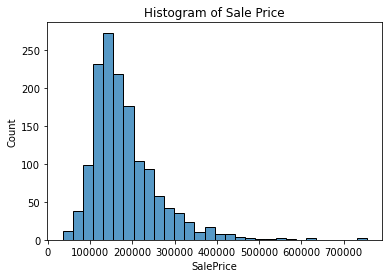

In [33]:
sns.histplot(fill_numeric_data.SalePrice, bins = 30)
# giving a title 
plt.title('Histogram of Sale Price')
plt.show()

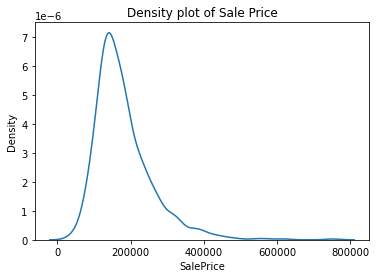

In [34]:
sns.kdeplot(fill_numeric_data.SalePrice)
# giving a title 
plt.title('Density plot of Sale Price')
plt.show()

The above plots and the skewness measure of 'SalePrice' variable indicate that it is positively skewed since it has longer tail to the right. The distribution of the target variable in linear regression is assumed to be normal, so we can consider its log transformation as the target variable in such an analysis if the assumption is not fullfilled due to positive skewness. 

### Log transformation

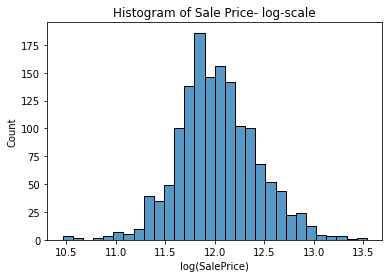

In [35]:
sns.histplot(np.log(fill_numeric_data.SalePrice), bins = 30)
# giving a title 
plt.xlabel('log(SalePrice)')
plt.title('Histogram of Sale Price- log-scale')
plt.show()

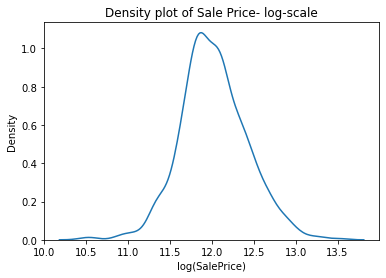

In [36]:
sns.kdeplot(np.log(fill_numeric_data.SalePrice))
plt.xlabel('log(SalePrice)')
plt.title('Density plot of Sale Price- log-scale')
plt.show()

The above plot show that assumption of normality on "log(SalePrice)" is quite resonable now. 

## Correlation plot

There should be some sort of functional relationship of type $$y = f(X)$$ between the target varaible (y)  and the features (X). If such a fucntional relationship becomes linear, then we write 
$$ y = a X + b $$ and we call regression line of y on X, and the corresponding analysis called regression analysis. The varaibles X are important (or stastically significant) in regression analysis only if they can linearly explain y. Hence, it is nessary to check their linear association. Pearson's correlation coefficents and pairwise scatter plots are usefull tools to measure the  the preliminary results.     

In [37]:
# Id is not a relevant variable, it is removed
# fill_numeric_data.keys() # check the key (name) of the variables
fill_numeric_data1 = fill_numeric_data.drop(['Id'], axis = 1)

In [38]:
corr_matrix = fill_numeric_data1.corr().abs()
corr_matrix["SalePrice"].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
MasVnrArea       0.472614
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.334771
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
KitchebvGr       0.135907
EnclosedPorch    0.128578
ScreenPorch      0.111447
PoolArea         0.092404
MSSubClass       0.084284
OverallCond      0.077856
MoSold           0.046432
3SsnPorch        0.044584
YrSold           0.028923
LowQualFinSF     0.025606
MiscVal          0.021190
BsmtHalfBath     0.016844
BsmtFinSF2       0.011378
Name: SalePrice, dtype: float64

In [39]:
cor_target_to_var = corr_matrix["SalePrice"].sort_values(ascending=False).drop(["SalePrice"], axis = 0)
significant_features = cor_target_to_var[cor_target_to_var > 0.5]
significant_features

OverallQual     0.790982
GrLivArea       0.708624
GarageCars      0.640409
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
FullBath        0.560664
TotRmsAbvGrd    0.533723
YearBuilt       0.522897
YearRemodAdd    0.507101
Name: SalePrice, dtype: float64

The variables whose Pearson's correlation coefficients with target varaible ("SalePrice") is less than 0.5 are considered as less significant in predicting the "SalePrice", and hence those varaibles are recomended to drop form our data frame.

## Correlated Covariates

<div class="alert alert-success alertsuccess" style="margin-top: 20px">
One of the assumptions of linear regression is that the explanatory varaibles to be independent and hence they are to be uncorrelated with each other. When two or more variables are correlated with each other, the output could possiblly influenced by the all those correlated varaibles even if we change one of the varaibles. So, we need to keep only one of them among the such correlated variables and drop the rest. 
<div/>  
    So let us check the correlation of selected features in our numerical dataset. This can be done either by visually checking it from the correlation matrix or from the code snippet presented below.


In [40]:
#significant_features.keys()
features_numeric_data = fill_numeric_data1[significant_features.keys()]

In [41]:
# Checking the colrrelation between the features
import warnings
warnings.filterwarnings('ignore')
cor_matrix = features_numeric_data.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
print(upper_tri)

              OverallQual  GrLivArea  GarageCars  GarageArea  TotalBsmtSF  \
OverallQual           NaN   0.593007    0.600671    0.562022     0.537808   
GrLivArea             NaN        NaN    0.467247    0.468997     0.454868   
GarageCars            NaN        NaN         NaN    0.882475     0.434585   
GarageArea            NaN        NaN         NaN         NaN     0.486665   
TotalBsmtSF           NaN        NaN         NaN         NaN          NaN   
1stFlrSF              NaN        NaN         NaN         NaN          NaN   
FullBath              NaN        NaN         NaN         NaN          NaN   
TotRmsAbvGrd          NaN        NaN         NaN         NaN          NaN   
YearBuilt             NaN        NaN         NaN         NaN          NaN   
YearRemodAdd          NaN        NaN         NaN         NaN          NaN   

              1stFlrSF  FullBath  TotRmsAbvGrd  YearBuilt  YearRemodAdd  
OverallQual   0.476224  0.550600      0.427452   0.572323      0.550684  
GrLi

In [42]:
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
print('---------'); print(to_drop)

---------
['GarageArea', '1stFlrSF', 'TotRmsAbvGrd']


In [43]:
features_numeric_data1 = features_numeric_data.drop(to_drop, axis=1)
cor_matrix1 = features_numeric_data1.corr().abs()
upper_tri1 = cor_matrix1.where(np.triu(np.ones(cor_matrix1.shape),k=1).astype(np.bool))
#print(upper_tri1)

In [44]:
features_Keep = features_numeric_data1.keys()
features_Keep

Index(['OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath',
       'YearBuilt', 'YearRemodAdd'],
      dtype='object')

We drop the varaibles for which the pariwise corralation is above 0.8 and keep the rest of the varaibles from the above descriptive analysis, and the final numerical dataset has been presented bellow:

In [45]:
filtered_numeric_data = fill_numeric_data1[['SalePrice','OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath',
       'YearBuilt', 'YearRemodAdd']]

In [46]:
corr_matrix = filtered_numeric_data.corr()
corr_matrix["SalePrice"].sort_values(ascending=False)

SalePrice       1.000000
OverallQual     0.790982
GrLivArea       0.708624
GarageCars      0.640409
TotalBsmtSF     0.613581
FullBath        0.560664
YearBuilt       0.522897
YearRemodAdd    0.507101
Name: SalePrice, dtype: float64

### Visualizing the Correlation Matrix in Heat map form 

In [47]:
# Setup plots
%matplotlib inline
plt.rcParams["figure.figsize"] = 10, 8
%config InlineBackend.figure_format = "retina"
sns.set()

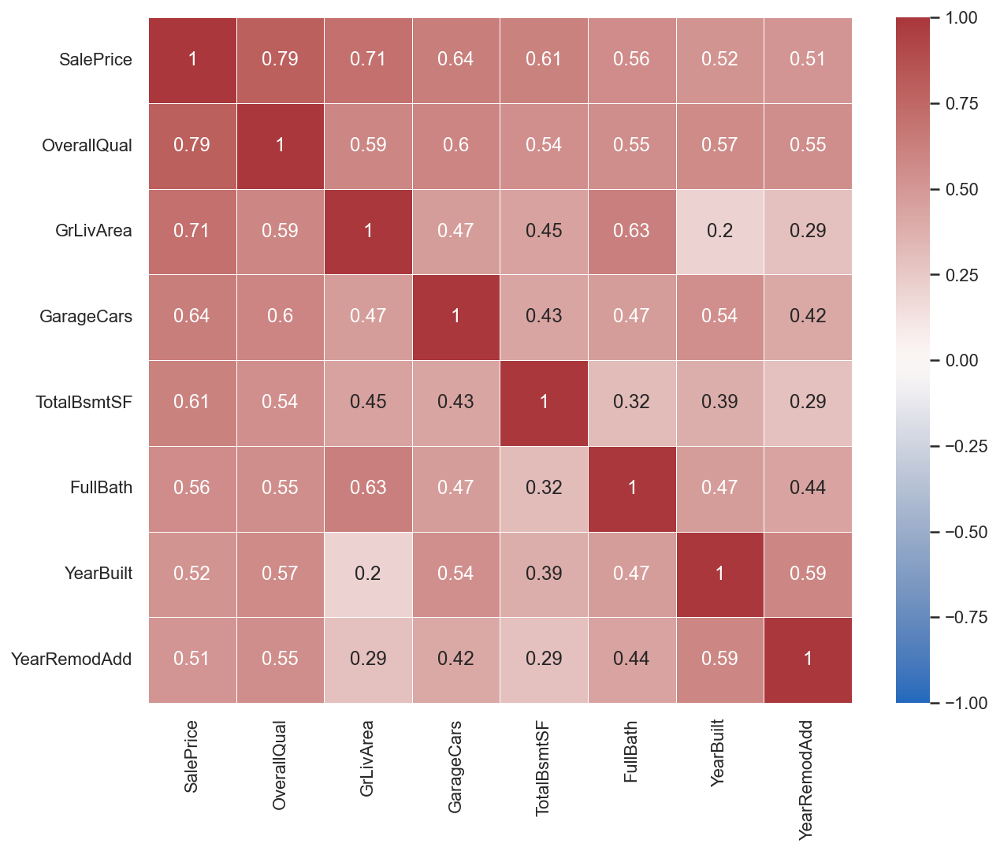

In [48]:
# Visualizing a Pandas Correlation Matrix Using Seaborn
matrix = corr_matrix.round(2)
sns.heatmap(matrix, annot=True, vmax=1, vmin=-1, center=0, cmap='vlag', linewidth = 0.5)
plt.show()

## Bi-varaite scattor plot and density

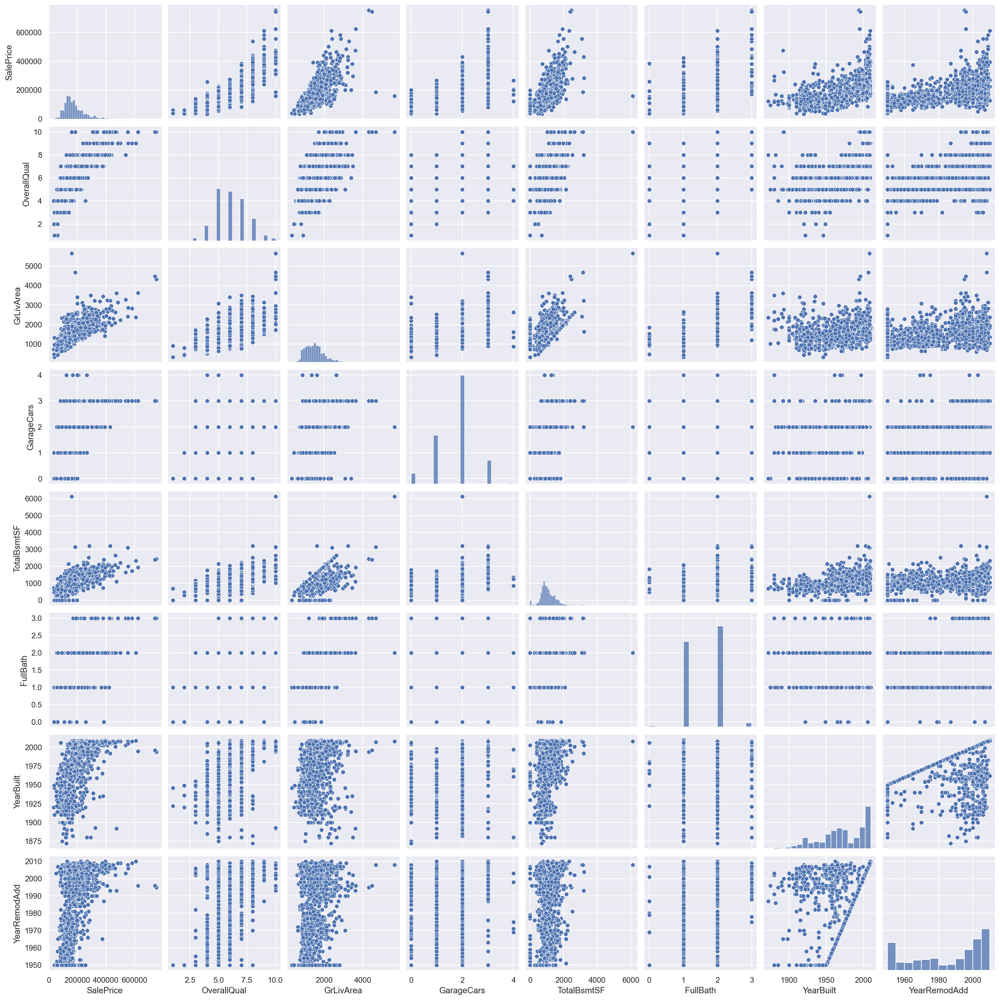

In [49]:
# pair plot and density
%matplotlib inline
plt.rcParams["figure.figsize"] = 8, 8
sns.pairplot(filtered_numeric_data)

From the above explanatory data analysis, we consider only six numerical varaibles for our final analysis including the target varaible "SalePrice"

# EDA of categorical variables

In [50]:
import math
import scipy.stats

%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns

In [51]:
categorical_data.head(5)

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,KitchenQual,Functiol,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal


In [52]:
var_name = categorical_data.columns


In [53]:
#check frequencies of the each of categories
var_name = categorical_data.columns
for i in range(categorical_data.shape[1]):
    df_var = categorical_data[var_name[i]].value_counts()
    #print(var_name[i])
    #print(df_var)
    #print("-----------------")

## Missing value treatment 

<div class="alert alert-success alertsuccess" style="margin-top: 20px">
The most common technique of imputing the missing values of the categorical varaibles, first we need to understand how the data is generated. For example some of the features has missing values becasue of the nonexistence of the such value. For example; in the Garage related columns the values are missing for those records where there is no grage. So, we need to take care of the data carefully while recovering such missing values. Then we can replce rest of the values by their corresponding mode.  Mode is more relevant because it is the value with maximum frequency or the most probable vlaue.
<div/>

We have already removed four of the categorical varaibles: "PoolQC", "MiscFeature", "Alley", "Fence", because they have more than $80\%$ of the values are NA. Let's check the count of missing values of the rest of the varaibles 

In [54]:
cat_null_status = np.sum(categorical_data.isnull(), axis = 0)
var_with_na = cat_null_status[cat_null_status > 0]
print(var_with_na)

MasVnrType        8
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
FireplaceQu     690
GarageType       81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64


The data description text refers that NA in the variables from  ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1","BsmtFinType2","FireplaceQu",
            "GarageType", "GarageFinish", "GarageQual", "GarageCond"] means that there is no such attributes such as Basement, Fireplace and Grage. Therefore, we transform those NA values to a new category as "None".

In [55]:
#Basement, fireplace, and Garage:   NA means Not exist
# NA transform to "None"
var_type = ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1","BsmtFinType2","FireplaceQu",
            "GarageType", "GarageFinish", "GarageQual", "GarageCond"]
cat_null_status = np.sum(categorical_data[var_type].isnull(), axis = 0)
var_with_na = cat_null_status[cat_null_status > 0]
print(var_with_na)

BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinType2     38
FireplaceQu     690
GarageType       81
GarageFinish     81
GarageQual       81
GarageCond       81
dtype: int64


In [56]:
basement_nan = ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1","BsmtFinType2"]
for i in basement_nan:
    categorical_data[i] = categorical_data[i].replace(np.nan, "None")

In [57]:
Garage_nan = ["GarageType", "GarageFinish", "GarageQual", "GarageCond"]
for i in Garage_nan:
    categorical_data[i] = categorical_data[i].replace(np.nan, "None")

In [58]:
categorical_data["FireplaceQu"] = categorical_data["FireplaceQu"].replace(np.nan, "None")

In [59]:
cat_null_status = np.sum(categorical_data.isnull(), axis = 0)
var_with_na = cat_null_status[cat_null_status > 0]
print(var_with_na)

MasVnrType    8
Electrical    1
dtype: int64


In [60]:
mode_cat_data = categorical_data.mode()
mode_cat_data.iloc[0]

MSZoning              RL
Street              Pave
LotShape             Reg
LandContour          Lvl
Utilities         AllPub
LotConfig         Inside
LandSlope            Gtl
Neighborhood         mes
Condition1          Norm
Condition2          Norm
BldgType            1Fam
HouseStyle        1Story
RoofStyle          Gable
RoofMatl         CompShg
Exterior1st      VinylSd
Exterior2nd      VinylSd
MasVnrType          None
ExterQual             TA
ExterCond             TA
Foundation         PConc
BsmtQual              TA
BsmtCond              TA
BsmtExposure          No
BsmtFinType1         Unf
BsmtFinType2         Unf
Heating             GasA
HeatingQC             Ex
CentralAir             Y
Electrical         SBrkr
KitchenQual           TA
Functiol             Typ
FireplaceQu         None
GarageType        Attchd
GarageFinish         Unf
GarageQual            TA
GarageCond            TA
PavedDrive             Y
SaleType              WD
SaleCondition     Normal
Name: 0, dtype: object

In [61]:
#fill_cat_data = categorical_data.fillna(mode_cat_data.iloc(0))
df = categorical_data
new_cat_data = df.fillna(mode_cat_data.iloc[0]) 
#new_cat_data.head()

In [62]:
cat_null_status = np.sum(new_cat_data.isnull(), axis = 0)
print(cat_null_status.sum())

0


## Count plot and box plot for bivariate analysis

The variables in  ["Street", "Utilities", "LandSlope",  "Condition2", "RoofMatl", "BsmtCond", "BsmtFinType2", "Heating", "CentralAir","Electrical","Functiol","GarageQual", "GarageCond", "PavedDrive", "SaleType","SaleCondition"] have more that $85\%$ of one categories and rest of the categories are very low and less than  $5\%$ which can be observed from the following count plots either. Therefore, those varaibles are going to drop from our dataset. 

Bivaraite analysis of numerical target variables vs categorical explanatory varaibles.
- X : categorical explanatory varaibles
- y : numerical response varable ('SalePrice') 

**Count plot**

In [63]:
cat_var = new_cat_data.keys()

In [64]:
# Count plots of categorical features
%matplotlib inline
f = pd.melt(new_cat_data, value_vars= sorted(cat_var))
g = sns.FacetGrid(f, col='variable', col_wrap=4, size=8, sharex=False, sharey=True)
#g.set(xlim=(0, 80), ylim=(0, 30))
plt.xticks(rotation='vertical')
g = g.map(sns.countplot, 'value', palette = 'rainbow')
[plt.setp(ax.get_xticklabels(), rotation=60) for ax in g.axes.flat]
g.fig.tight_layout()
plt.show()

In [65]:
### Low frequencies categories
list_cat_freq = list()
for i in range(len(cat_var)):
    var_freq = (df[cat_var[i]].value_counts())/new_cat_data.shape[0]
    list_cat_freq.append(var_freq)
    print("percentage of frequencies in each of the categories")
    print(cat_var[i])
    print(var_freq)
    print("---------------------------------------------------")

percentage of frequencies in each of the categories
MSZoning
RL         0.788356
RM         0.149315
FV         0.044521
RH         0.010959
C (all)    0.006849
Name: MSZoning, dtype: float64
---------------------------------------------------
percentage of frequencies in each of the categories
Street
Pave    0.99589
Grvl    0.00411
Name: Street, dtype: float64
---------------------------------------------------
percentage of frequencies in each of the categories
LotShape
Reg    0.633562
IR1    0.331507
IR2    0.028082
IR3    0.006849
Name: LotShape, dtype: float64
---------------------------------------------------
percentage of frequencies in each of the categories
LandContour
Lvl    0.897945
Bnk    0.043151
HLS    0.034247
Low    0.024658
Name: LandContour, dtype: float64
---------------------------------------------------
percentage of frequencies in each of the categories
Utilities
AllPub    0.999315
NoSeWa    0.000685
Name: Utilities, dtype: float64
------------------------------

**Drop variables with categories of very high and low frequencies**

In [66]:
# drop varable with highly inbalance frequencies
drop_var = ["Street", "Utilities", "LandSlope",  "Condition2", "RoofMatl", "BsmtCond", "BsmtFinType2", "Heating", "CentralAir","Electrical","Functiol","GarageQual", "GarageCond", "PavedDrive", "SaleType","SaleCondition"]    
cat_data = new_cat_data.drop(drop_var, axis = 1)
#cat_data.keys()

In [67]:
# Count plot of categorical features
cat_var = list(cat_data.keys())
SalePrice = Housing_Ames[["SalePrice"]]
df = pd.concat([SalePrice, cat_data], axis = 1)

## Box plot

Box plot helps us to indetify the potential outlier in the data set. Similar information can also obtain from violin plot and swarmplot.  The bi-varaite box plot, violin plot and swarmplot have been presented below:

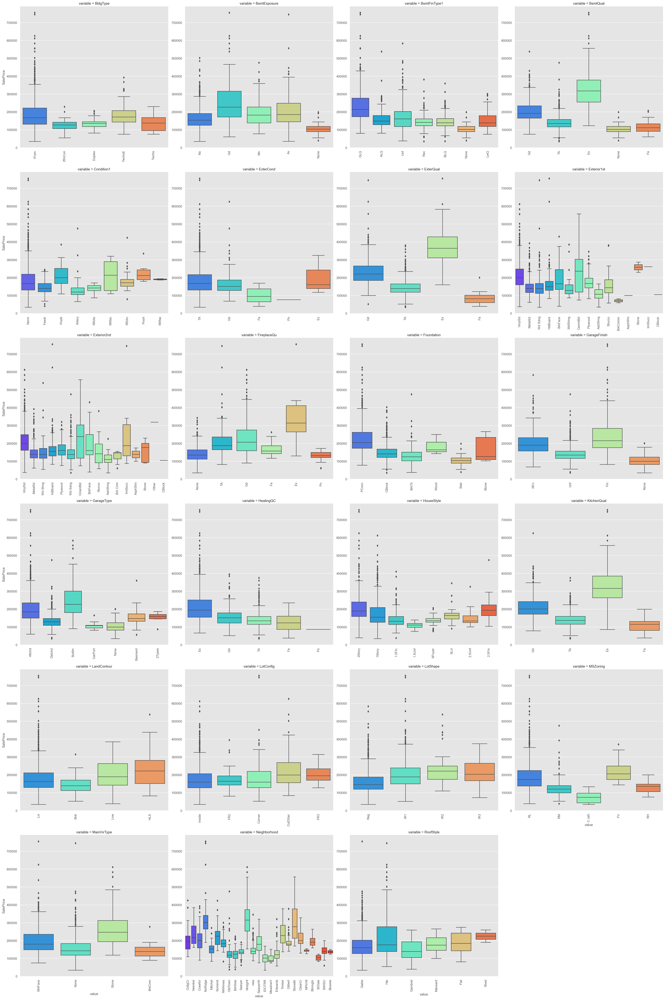

In [68]:
f = pd.melt(df, id_vars = ["SalePrice"], value_vars = sorted(cat_var))
g = sns.FacetGrid(f, col='variable', col_wrap=4, sharex=False, sharey=False, size=8)
g = g.map(sns.boxplot, 'value', 'SalePrice',palette = 'rainbow')
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat]
g.fig.tight_layout()
plt.show()

**Violin plot**

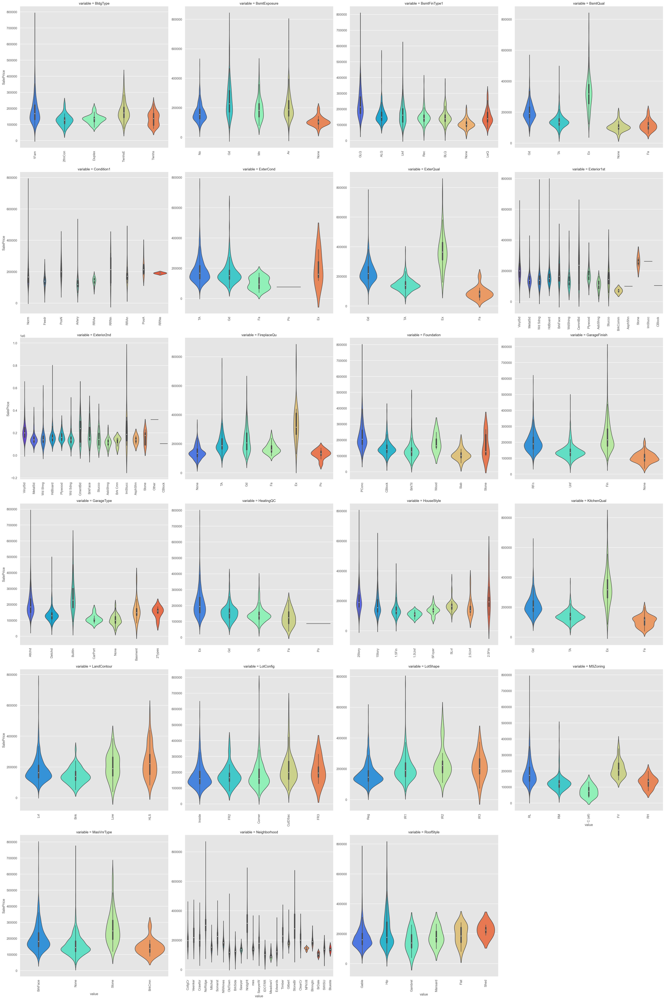

In [69]:
f = pd.melt(df, id_vars = ["SalePrice"], value_vars = sorted(cat_var))
g = sns.FacetGrid(f, col='variable', col_wrap=4, sharex=False, sharey=False, size=8)
g = g.map(sns.violinplot, 'value', 'SalePrice',palette = 'rainbow')
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat]
g.fig.tight_layout()
plt.show()

**Swarm plot**

In [70]:
#import warnings
#warnings.filterwarnings('ignore')
#f = pd.melt(df, id_vars = ["SalePrice"], value_vars = sorted(cat_var))
#g = sns.FacetGrid(f, col='variable', col_wrap=4, sharex=False, sharey=False, size=6)
#g = g.map(sns.swarmplot, 'value', 'SalePrice',palette = 'rainbow')
#[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat]
#g.fig.tight_layout()
#plt.show()

The above graphs show there are many outliers in our dataset. We need to take care of those before starting the analysis.

## Bi-varaite Scatter plot
Bi-varaite scatter plot and bar-plot of one of the categorical varaibles vs the target variable helps us to understand the degree association between those varaibles.

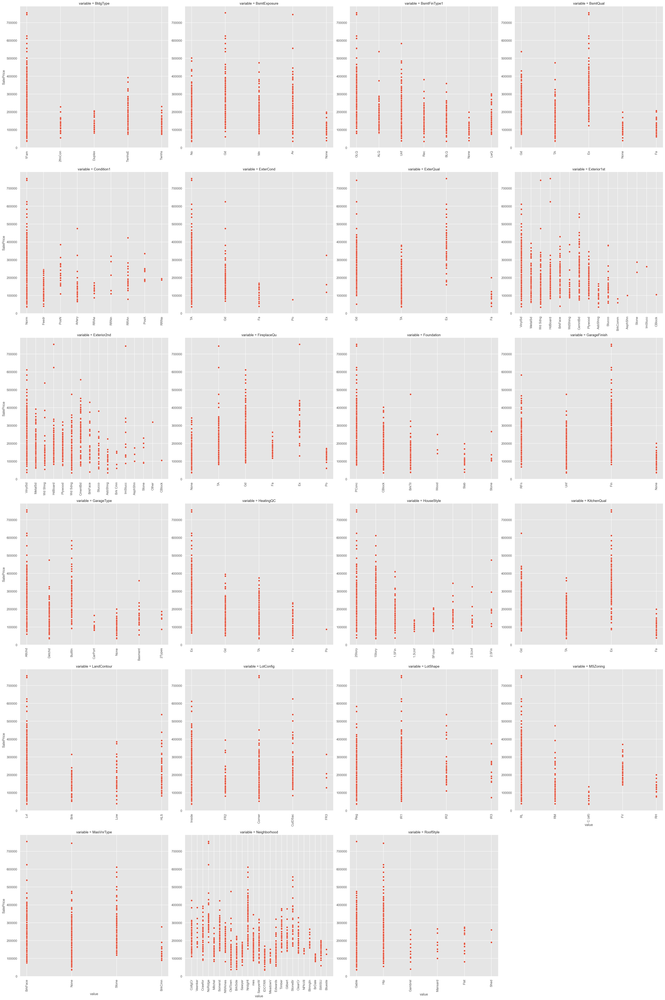

In [71]:
# Scatter plot
f = pd.melt(df, id_vars = ["SalePrice"], value_vars = sorted(cat_var))
g = sns.FacetGrid(f, col='variable', col_wrap=4, sharex=False, sharey=False, size=8)
g = g.map(sns.scatterplot, 'value', 'SalePrice', palette = 'rainbow')
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat]
g.fig.tight_layout()
plt.show()

## Bi-variate bar plot

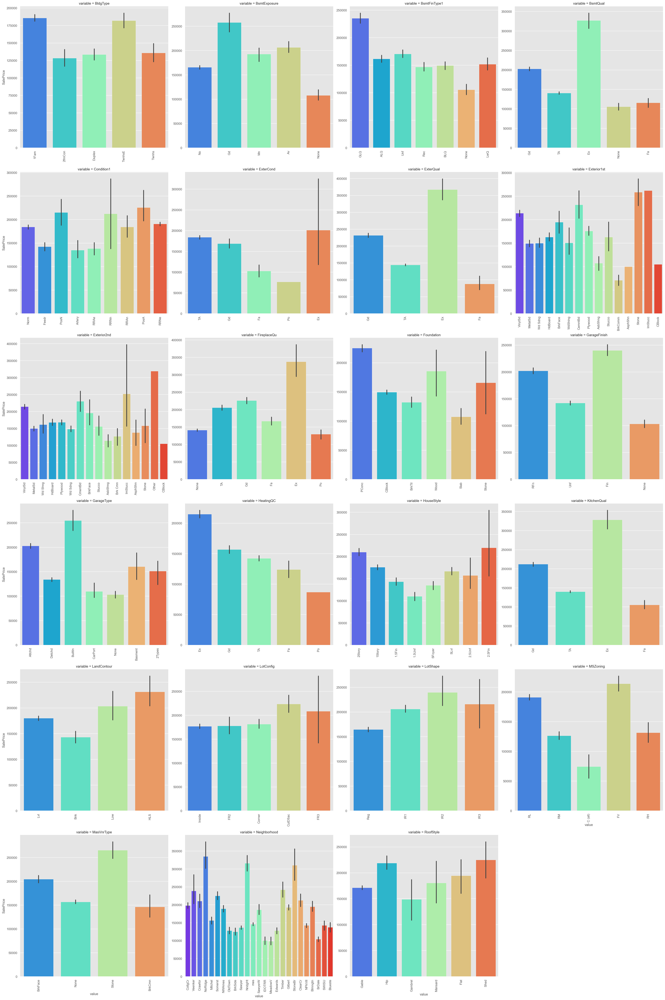

In [72]:
# bar plot
f = pd.melt(df, id_vars = ["SalePrice"], value_vars = sorted(cat_var))
g = sns.FacetGrid(f, col='variable', col_wrap=4, sharex=False, sharey=False, size=8)
g = g.map(sns.barplot, 'value', 'SalePrice', palette = 'rainbow')
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat]
g.fig.tight_layout()
plt.show()

**Stir-plot**

In [73]:
# stir plot
#f = pd.melt(df, id_vars = ["SalePrice"], value_vars = sorted(cat_var))
#g = sns.FacetGrid(f, col='variable', col_wrap=, sharex=False, sharey=False, size=5)
#g = g.map(sns.stripplot, 'value', 'SalePrice', palette = 'rainbow')
#[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat]
#g.fig.tight_layout()
#plt.show()

The above scatter plot and bar-plot show that the selected varaibles has some association with the target variables as we can see higher and lower values in differrent levels. This helps us to think of their mean effects are not the same which can be tested through the infrential statistics mainly using pair-wise t-test or ANOVA.  

## Chi-Square test of independence
Chi-Square test is widely used in statistics to determine the stastical significance of difference between the observed and expected frequencies. Besides, it can be used to determine whether two categorical varaibles are independent or not, and the test is referred as chi-square test of independence. The main idea here is that if two varaibles are related, then their conditional distributions are marginal distributions are not the same. The conclusion of the test is made by measuring the difference between the observed conditional distribution of one varaibles across the levels of the other, and comparing it to the marginal distribution of that varaible. 

The basic assumptions of $\chi^2$ test of independence:
- Two samples are independent
- No expected cell count is 0
- The expected value should be $\geq$ 5 in at least 80% of the cells.

The null and alternative of the test is defined as follows:
- null (H0) : the varaibles are independent
- alternative (H1): two varaibles are related

In [74]:
#import researchpy as rp
import scipy.stats as stats
from scipy.stats import chi2

cross_tab = pd.crosstab(df['MSZoning'],  df['LotShape'])
cross_tab

LotShape,IR1,IR2,IR3,Reg
MSZoning,,,,
C (all),1,0,0,9
FV,10,3,0,52
RH,2,1,0,13
RL,455,35,9,652
RM,16,2,1,199


In [75]:
temp_tab = list()
lst_tab_name = list()
j = 0
for i in range(len(cat_var)):
    for j in range(i):
        tab_name = cat_var[i] + "-" + cat_var[j]
        lst_tab_name.append(tab_name)
        cross_tab =  pd.crosstab(df[cat_var[i]], df[cat_var[j]])
        temp_tab.append(cross_tab)

In [76]:
# Number of combinations 
from math import comb
ln = len(cat_var)
comb(ln,2), len(temp_tab)

(253, 253)

In [77]:
lst_chi2 = list() 
lst_p_value = list()
for i in range(len(temp_tab)):
    chi2, p_value, deg_fredom, expected = stats.chi2_contingency(temp_tab[i])
    lst_chi2.append(chi2)
    lst_p_value.append(p_value)  

In [78]:
p_values = np.array( lst_p_value)#.reshape(39,19)
idx = np.where(p_values > 0.05)
idx = idx[0]

In [79]:
print("the combinations of categorical variables where the association is stastically significant:")
for i in idx:
    print(lst_tab_name[i])

the combinations of categorical variables where the association is stastically significant:
Condition1-LandContour
HouseStyle-LotConfig
RoofStyle-LotShape
Exterior1st-LotConfig
MasVnrType-LotConfig
MasVnrType-Condition1
ExterQual-LotConfig
ExterCond-LotShape
ExterCond-LandContour
ExterCond-LotConfig
ExterCond-Condition1
Foundation-LotConfig
BsmtExposure-ExterCond
HeatingQC-LotConfig
HeatingQC-RoofStyle
KitchenQual-LotConfig
FireplaceQu-Condition1
FireplaceQu-ExterCond
GarageFinish-LotConfig


In [80]:
cat_var = df.columns
drop_var_again = ["SalePrice", "LandContour", "LotConfig", "FireplaceQu", "LotShape", "RoofStyle", "Condition1", "BsmtExposure"]
cat_var1 = cat_var.drop(drop_var_again)
print("the varaibles dropped from out dataframe are:")
print(cat_var1)

the varaibles dropped from out dataframe are:
Index(['MSZoning', 'Neighborhood', 'BldgType', 'HouseStyle', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtFinType1', 'HeatingQC', 'KitchenQual', 'GarageType',
       'GarageFinish'],
      dtype='object')


In [81]:
temp_tab = list()
lst_tab_name = list()
j = 0
for i in range(len(cat_var1)):
    for j in range(i):
        tab_name = cat_var1[i] + "_" + cat_var1[j]
        lst_tab_name.append(tab_name)
        cross_tab =  pd.crosstab(df[cat_var1[i]], df[cat_var1[j]])
        temp_tab.append(cross_tab)

In [82]:
lst_chi2 = list() 
lst_p_value = list()
for i in range(len(temp_tab)):
    chi2, p_value, deg_fredom, expected = stats.chi2_contingency(temp_tab[i])
    lst_chi2.append(chi2)
    lst_p_value.append(p_value)  

In [83]:
p_values = np.array( lst_p_value)#.reshape(39,19)
idx = np.where(p_values > 0.05)
idx = idx[0]
idx

array([], dtype=int64)

We found that no assocaition is statistically significant under $\chi^2$ - test of independence.

## Cramer's V
The common appraoch of checking the association of two categorical varaibles is the chi-square test of independence; however, chi-square test can only detect whether an association exist or not but not the degree of association. For instance a p-value close to zero suggests that two variables are some how associated. This does not mean two varaibles are strongly associted; on the contrary a waek association in a data set with large sample size may also results samll p-value. 
Cramer's V is a number between 0 and 1 that measures the association of two categorical varaibles:
[see for more details.](https://www.spss-tutorials.com/cramers-v-what-and-why/)

In [84]:
#pip install association-metrics

In [85]:
# Import association_metrics  
import association_metrics as am
# Convert you str columns to Category columns
df = df.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x)
# Initialize a CamresV object using you pandas.DataFrame
cramersv = am.CramersV(df[cat_var]) 
# will return a pairwise matrix filled with Cramer's V, where columns and index are 
# the categorical variables of the passed pandas.DataFrame
cramersv_fit_mat = cramersv.fit()

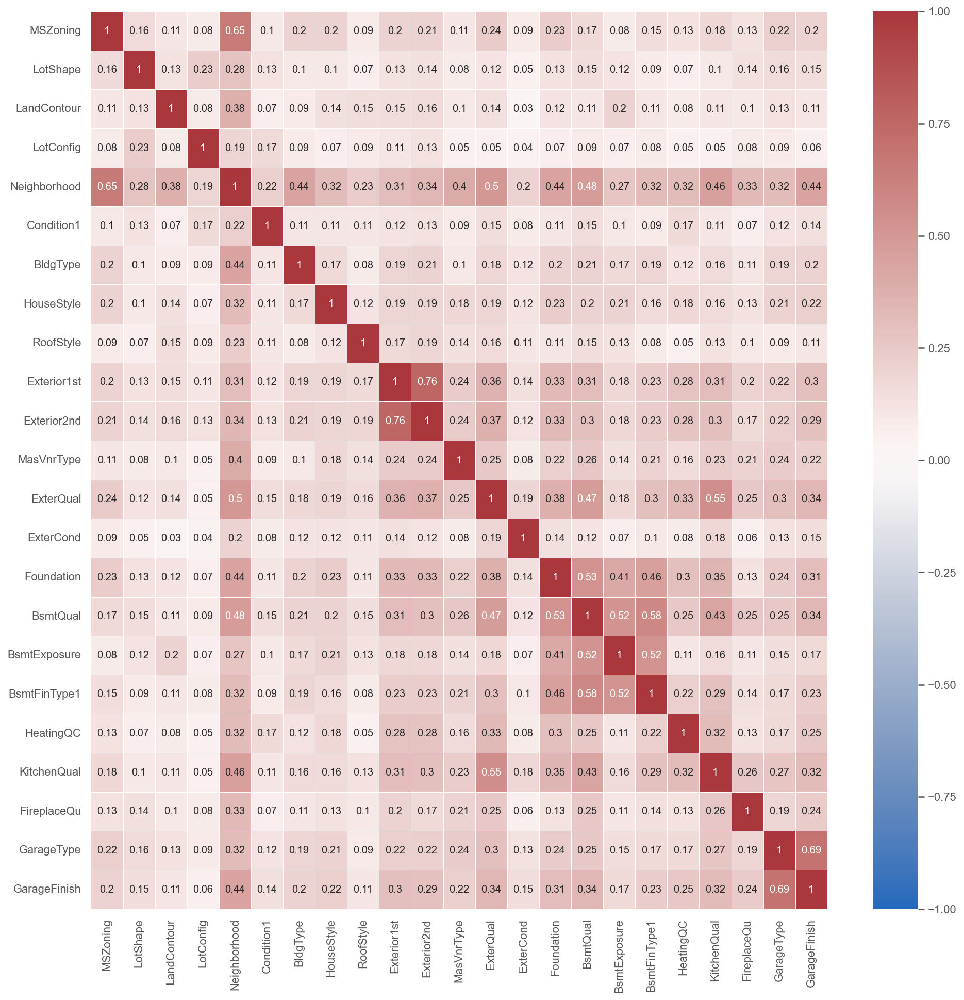

In [86]:
# Visualizing a Pandas Correlation Matrix Using Seaborn
plt.rcParams["figure.figsize"] = (16,16)
matrix = cramersv_fit_mat.round(2)
sns.heatmap(matrix, annot=True, vmax=1, vmin=-1, center=0, cmap='vlag', linewidth = 0.5)
plt.show()

In [87]:
cramersv_fit_mat = cramersv.fit()
upper_tri = cramersv_fit_mat.where(np.triu(np.ones(cramersv_fit_mat.shape),k=1).astype(np.bool))

In [88]:
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
print('to drop varaibels if any')
print(to_drop)

to drop varaibels if any
[]


Although $\chi^2$ - test of independence shows that the statistical significance of association between pair of some of the variables listed above; however Cramer's V matrix does not detect any of strong linear  association between them under the threshold 0.8. The existence of association varaibles in the $\chi^2$ - test could have been exist due to low frequencies in some of the categories.  

## Combine all the significant categorical and numerical variables
     
 **Dealing with outlier**
 
 We now combine the dataset with both types of varaibles and check whether the data have any outlier. 
 There are varaious techniques for detecting and dealing with outlier. The very basic practice is to use the box plot to identify the potential outliers; however, the domain knowledge is important with dealing with the outlier. After detecting the out lier two common approaches are 
 - remove the records which is outsied the range. But in this method we may lose the important information in the dataset, and it downsize the dataset, which cannot be applied if the the datasize is relatively small.
 - an alternative approach is to map those potential outliers to new values, usually by the lower and upper limits. We are going to use this approach to transform the outlier of our numerical values in this project. 

In [89]:
combine_data = pd.concat([filtered_numeric_data, df.drop(["SalePrice"], axis = 1)], axis = 1)

**GrLivArea**

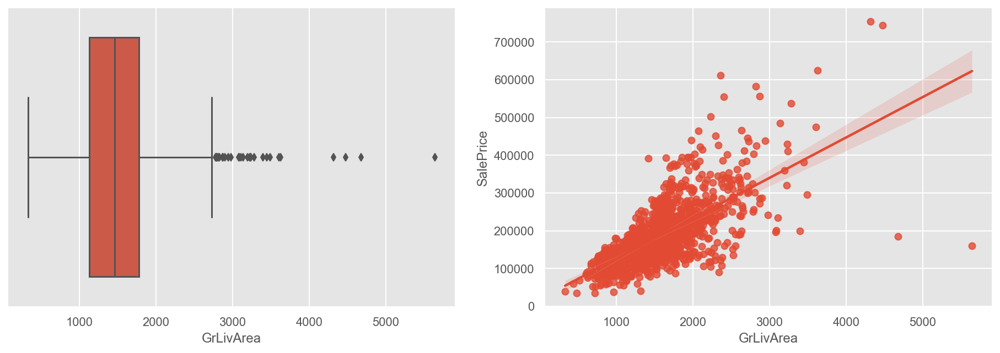

In [90]:
plt.rcParams['figure.figsize'] = (16, 5)
# plot 1
plt.subplot(1, 2, 1)
sns.boxplot(combine_data.GrLivArea)
#plot 2:
plt.subplot(1, 2, 2)
sns.regplot(combine_data.GrLivArea, combine_data.SalePrice)
plt.show()

In [91]:
# GrLivArea varaible
q1 = combine_data["GrLivArea"].quantile(0.25)
q3 = combine_data["GrLivArea"].quantile(0.75)
low, up = q1 - 1.5*(q3 - q1)/2, q3 + 1.5*(q3 - q1) 

In [92]:
outlier_low = combine_data["GrLivArea"] < low
outlier_up = combine_data["GrLivArea"] > up
combine_data.GrLivArea[outlier_low] =  low
combine_data.GrLivArea[outlier_up] =  up

**TotalBsmtSF varaible**

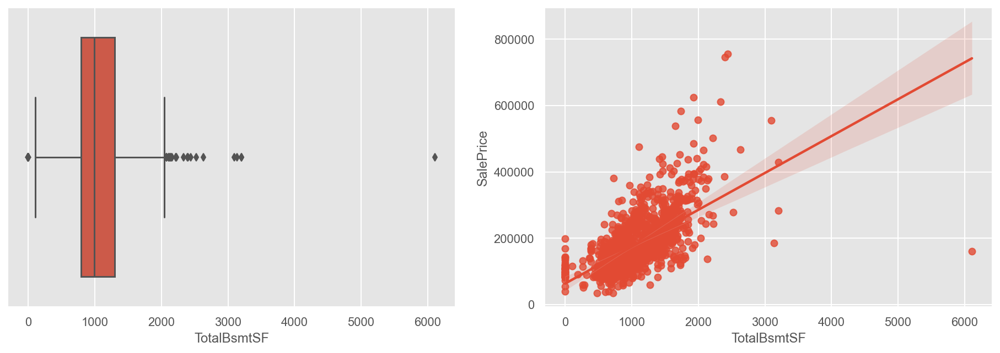

In [93]:
#TotalBsmtSF variable
plt.rcParams['figure.figsize'] = (16, 5)
# plot 1
plt.subplot(1, 2, 1)
sns.boxplot(combine_data.TotalBsmtSF)
#plot 2:
plt.subplot(1, 2, 2)
sns.regplot(combine_data.TotalBsmtSF, combine_data.SalePrice)
plt.show()

In [94]:
# TotalBsmtSF varaible
q1 = combine_data["TotalBsmtSF"].quantile(0.25)
q3 = combine_data["TotalBsmtSF"].quantile(0.75)
low, up = q1 - 1.5*(q3 - q1)/2, q3 + 1.5*(q3 - q1) 
low, up

(418.875, 2052.0)

In [95]:
outlier_low = combine_data["TotalBsmtSF"] < low
outlier_up = combine_data["TotalBsmtSF"] > up
combine_data.TotalBsmtSF[outlier_low] =  low
combine_data.TotalBsmtSF[outlier_up] =  up

**YearBuilt varaible**

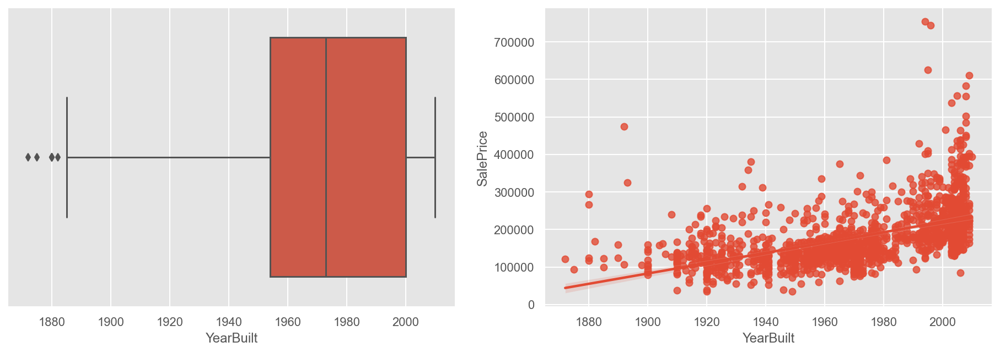

In [96]:
#TotalBsmtSF variable
plt.rcParams['figure.figsize'] = (16, 5)
# plot 1
plt.subplot(1, 2, 1)
sns.boxplot(combine_data["YearBuilt"])
#plot 2:
plt.subplot(1, 2, 2)
sns.regplot(combine_data["YearBuilt"], combine_data["SalePrice"])
plt.show()

In [97]:
# YearBuilt varaible
q1 = combine_data["YearBuilt"].quantile(0.25)
q3 = combine_data["YearBuilt"].quantile(0.75)
low, up = q1 - 1.5*(q3 - q1)/2, q3 + 1.5*(q3 - q1) 
low, up

(1919.5, 2069.0)

In [98]:
outlier_low = combine_data["YearBuilt"] < low
outlier_up = combine_data["YearBuilt"] > up
combine_data["YearBuilt"][outlier_low] =  low
combine_data["YearBuilt"][outlier_up] =  up

**YearRemodAdd varaible**

Year remodel has no outlier detected

**After mapping the outliers of the numerical valriable**

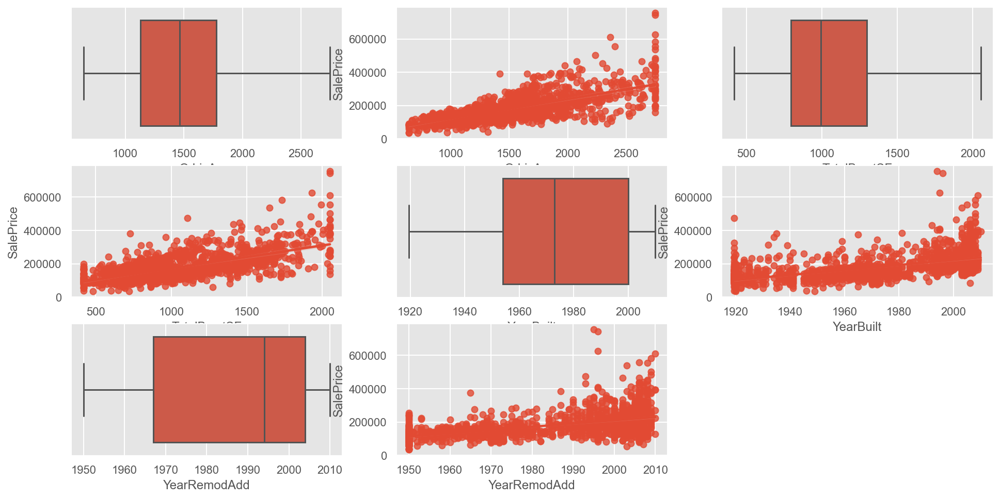

In [99]:
plt.rcParams['figure.figsize'] = (16, 8)
#-------------------------------GrLivArea variable
# plot 1
plt.subplot(3, 3, 1)
sns.boxplot(combine_data.GrLivArea)
#plot 2:
plt.subplot(3, 3, 2)
sns.regplot(combine_data.GrLivArea, combine_data.SalePrice)
#--------------------------TotalBsmtSF variable
# plot 3
plt.subplot(3, 3, 3)
sns.boxplot(combine_data.TotalBsmtSF)
# plot 4
plt.subplot(3, 3, 4)
sns.regplot(combine_data.TotalBsmtSF, combine_data.SalePrice)
#--------------------------------YearBuilt variable
# plot 5
plt.subplot(3, 3, 5)
sns.boxplot(combine_data["YearBuilt"])
# plot 6
plt.subplot(3, 3, 6)
sns.regplot(combine_data["YearBuilt"], combine_data["SalePrice"])
#-----------------------------YearRemodAdd
# plot 7 
plt.subplot(3, 3, 7)
sns.boxplot(combine_data["YearRemodAdd"])
# plot 8
plt.subplot(3, 3, 8)
sns.regplot(combine_data["YearRemodAdd"], combine_data["SalePrice"])
plt.show()

**SalePrice and logSalePrice varaible**

The "SalePrice" variable is highly positively skewed and so we use it log transformation and see how the skewness of the variable changed. The density plot and histograms indicate that log transformation of "SalePrice" is approximately normal.

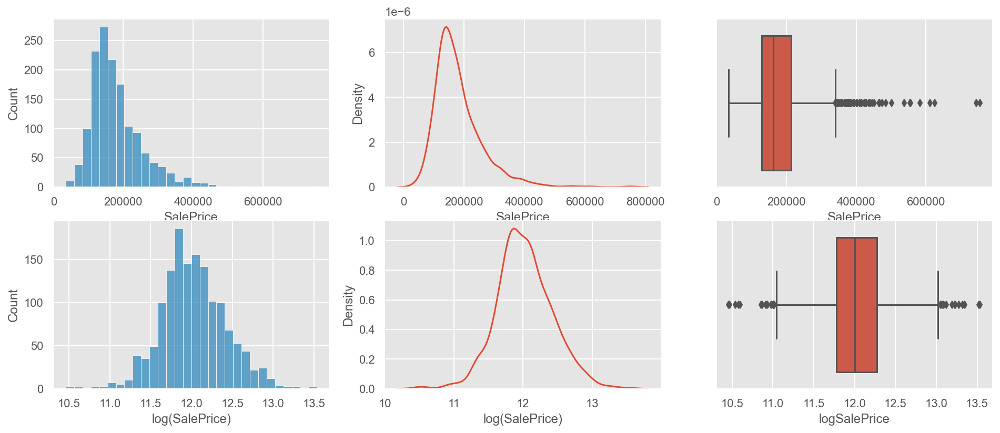

In [100]:
#SalePrice and logSalePrice variable
combine_data['logSalePrice'] = np.log(combine_data["SalePrice"])
plt.rcParams['figure.figsize'] = (16, 10)
# plot 1
plt.subplot(3, 3, 1)
sns.histplot(combine_data["SalePrice"], bins = 30)
# giving a title 
plt.xlabel('SalePrice')
#plt.title('Histogram of Sale Price- log-scale')
# plot 2
plt.subplot(3, 3, 2)
sns.kdeplot(combine_data["SalePrice"])
plt.xlabel('SalePrice')
# plot 3
plt.subplot(3, 3, 3)
sns.boxplot(combine_data["SalePrice"])
# plot 4
plt.subplot(3, 3, 4)
sns.histplot(combine_data["logSalePrice"], bins = 30)
# giving a title 
plt.xlabel('log(SalePrice)')
#plt.title('Histogram of Sale Price- log-scale')
# plot 5
plt.subplot(3, 3, 5)
sns.kdeplot(combine_data["logSalePrice"])
plt.xlabel('log(SalePrice)')
#plt.title('Density plot of Sale Price- log-scale')
# plot 6
plt.subplot(3, 3, 6)
sns.boxplot(combine_data["logSalePrice"])
plt.show()

**Check for categorical varaibles with logSalePrice varaible**

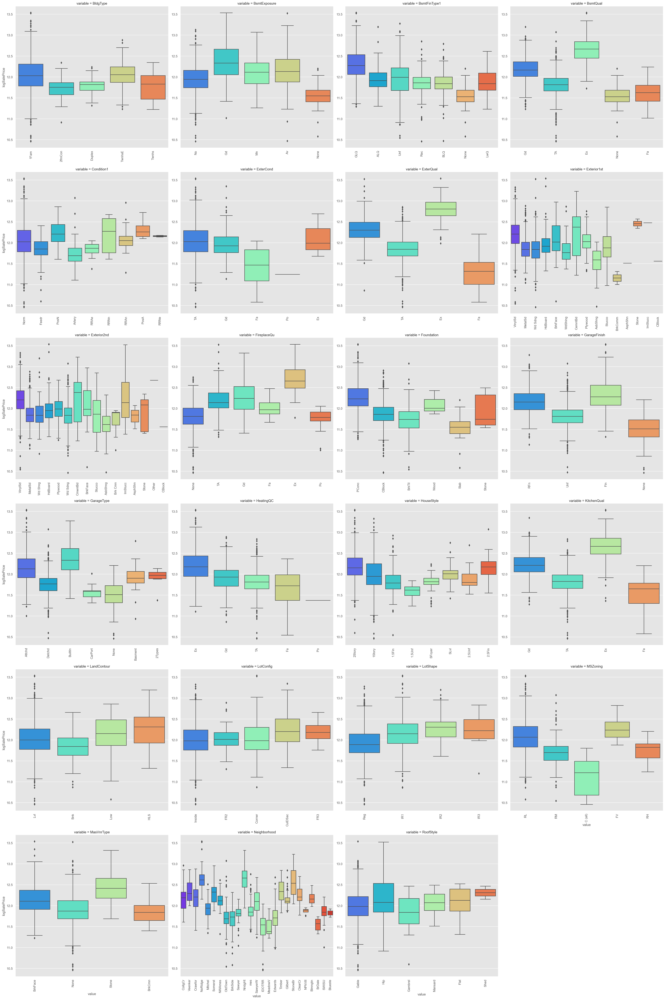

In [101]:
categorical_data = combine_data.select_dtypes(exclude=[np.number])
var = categorical_data.keys()
f = pd.melt(combine_data, id_vars = ["logSalePrice"], value_vars = sorted(var))
g = sns.FacetGrid(f, col='variable', col_wrap=4, sharex=False, sharey=False, size=8)
g = g.map(sns.boxplot, 'value', 'logSalePrice',palette = 'rainbow')
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat]
g.fig.tight_layout()
plt.show()

The above figure still shows that we have some the outliers on the target varaible "logSalePrice", however the log-transforamtion looks more symmetric. It is expected that the above processed dataset will be helpful to show the functional relationship with the "SalePrice" of the houses. Moreover, there are some categorical variables that explan the quality of those features which can be ordered numerically. Besides, all the other categorical varaibles can be transformed to the numerical varaibles using one hot encoding or dummy variable encoding approach to work with linear regression analysis of the "SalePrice" on the feature set. 